# Vollständige First-Level Analyse

### module importieren

In [1]:
import glob

import numpy as np
import pandas as pd
from sklearn import preprocessing

from nilearn import plotting, image, input_data
from nistats import first_level_model, reporting, regression

import seaborn as sns
import matplotlib.pyplot as plt

sns.set_context('talk')

/opt/miniconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/opt/miniconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192
  return f(*args, **kwds)
/opt/miniconda3/lib/python3.7/importlib/_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
/opt/miniconda3/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


### Strukturelles Bild

In [2]:
mpr_img = '../data/sub-01_T1w_space-MNI152NLin2009cAsym_preproc.nii.gz'

/opt/miniconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)
/opt/miniconda3/lib/python3.7/site-packages/nilearn/plotting/displays.py:600: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working
  if isinstance(axes, collections.Sequence):


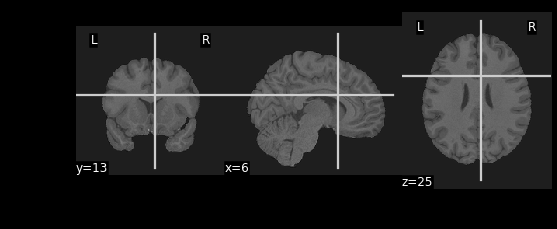

In [3]:
plotting.plot_anat(mpr_img);

### fMRT-Daten

In [4]:
fmri_img_list = glob.glob('../data/sub-01_task-imagery_run-0*_bold_space-MNI152NLin2009cAsym_preproc.nii.gz')
fmri_img_list.sort()
fmri_img_list = fmri_img_list[1:]
fmri_img_list

['../data/sub-01_task-imagery_run-01_bold_space-MNI152NLin2009cAsym_preproc.nii.gz',
 '../data/sub-01_task-imagery_run-02_bold_space-MNI152NLin2009cAsym_preproc.nii.gz',
 '../data/sub-01_task-imagery_run-03_bold_space-MNI152NLin2009cAsym_preproc.nii.gz',
 '../data/sub-01_task-imagery_run-04_bold_space-MNI152NLin2009cAsym_preproc.nii.gz']

Beispiel:

/opt/miniconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


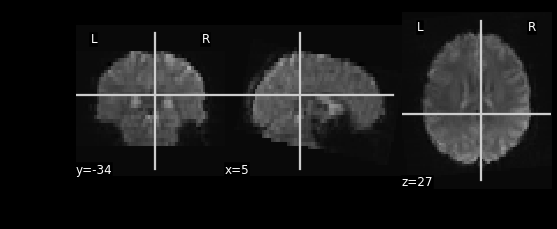

In [5]:
mean_epi_img = image.mean_img(fmri_img_list[-1])
plotting.plot_anat(mean_epi_img);

### alle runs hintereinanderhängen

In [6]:
fmri_imgs = image.concat_imgs(fmri_img_list)

wie viele Volumen sind in einem run?

In [7]:
n_volumes = image.load_img(fmri_img_list[-1]).shape[-1]
n_volumes

203

wie viele Volumen sind in der zusammengeführten Zeitserie?

In [8]:
fmri_imgs.shape

(65, 77, 40, 812)

### Das Design

In [9]:
onset_csvs = glob.glob('../data/sub-01_task-imagery_run-0*_events.tsv')
onset_csvs.sort()
onset_csvs = onset_csvs[1:]
onset_csvs

['../data/sub-01_task-imagery_run-01_events.tsv',
 '../data/sub-01_task-imagery_run-02_events.tsv',
 '../data/sub-01_task-imagery_run-03_events.tsv',
 '../data/sub-01_task-imagery_run-04_events.tsv']

Beispiel (letzter run):

In [10]:
pd.read_csv(onset_csvs[-1],sep='\t')

,onset,duration,trial_domain,trial_subdomain,trial_content
0,0,30,SPRACHE,Schreiben,Staedte
1,30,30,MOTORIK,Fuesse,Trampolin
2,60,30,GESICHTER,Beruehmt,Sportler
3,90,30,EMOTION,Positiv,Berg
4,120,30,RUHE,Ruhe,Ruhe
5,150,30,MOTORIK,Haende,Ballwerfen
6,180,30,EMOTION,Negativ,Strand
7,210,30,GESICHTER,Bekannt,Schulfreunde
8,240,30,SPRACHE,Sprechen,Vornamen
9,270,30,RUHE,Ruhe,Ruhe


### die zu analysierende Bedingung auswählen (trial_type)

<font color=orange>__Modifikation:__ Statt trial_domain (die 5 Oberbedingungen), kann man auch eine andere Spalte der Onset-Tabelle nutzen um Bedingungen zu definieren</font>

In [11]:
def make_onsets(csv_file):
    df = pd.read_csv(csv_file,sep='\t')
    df.loc[:,'trial_num'] = [('0%s'%x)[-2:] for x in df.index.get_values().astype(str)]
    #df.loc[:,'trial_type'] = df.loc[:,'trial_domain']
    df.loc[:,'trial_type'] = df.loc[:,'trial_subdomain']

    return df

In [12]:
onset_df = make_onsets(onset_csvs[-1])
onset_df

,onset,duration,trial_domain,trial_subdomain,trial_content,trial_num,trial_type
0,0,30,SPRACHE,Schreiben,Staedte,00,Schreiben
1,30,30,MOTORIK,Fuesse,Trampolin,01,Fuesse
2,60,30,GESICHTER,Beruehmt,Sportler,02,Beruehmt
3,90,30,EMOTION,Positiv,Berg,03,Positiv
4,120,30,RUHE,Ruhe,Ruhe,04,Ruhe
5,150,30,MOTORIK,Haende,Ballwerfen,05,Haende
6,180,30,EMOTION,Negativ,Strand,06,Negativ
7,210,30,GESICHTER,Bekannt,Schulfreunde,07,Bekannt
8,240,30,SPRACHE,Sprechen,Vornamen,08,Sprechen
9,270,30,RUHE,Ruhe,Ruhe,09,Ruhe


### Aus den Onsets das Design erstellen

Meta-Informationen zu den runs

In [13]:
my_tr = 3
my_duration = n_volumes*my_tr
my_duration # dauer eines runs in sekunden (volumes x tr)

609

Onsets mit HRF verbinden

<font color=orange>__Modifikation:__ Drifts in das Modell aufnehmen (drift_model)</font>

<font color=red>__Modifikation:__ Den Cutoff des High-Pass Filter verändern</font>

In [14]:
def make_design(df,my_tr=my_tr,my_duration=my_duration):
    frame_times = np.arange(0,my_duration,my_tr)
    design_matrix = first_level_model.make_first_level_design_matrix(frame_times=frame_times,
                                                                     events=df,
                                                                     #drift_model=None
                                                                     period_cut=300,
                                                                    )
    return design_matrix

Beispiel:

/opt/miniconda3/lib/python3.7/site-packages/nistats/hemodynamic_models.py:268: DeprecationWarning: object of type <class 'numpy.float64'> cannot be safely interpreted as an integer.
  frame_times.max() * (1 + 1. / (n - 1)), n_hr)
/opt/miniconda3/lib/python3.7/site-packages/nistats/hemodynamic_models.py:55: DeprecationWarning: object of type <class 'float'> cannot be safely interpreted as an integer.
  time_stamps = np.linspace(0, time_length, float(time_length) / dt)


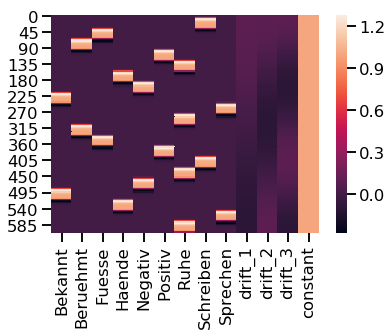

In [15]:
sns.heatmap(make_design(onset_df));

### Ein großes Design für alle 4 runs

In [16]:
def make_big_design(onset_csvs):
    
    design_matrix = pd.DataFrame()
    for run_num,onset_csv in enumerate(onset_csvs):
        this_onset = make_onsets(onset_csv)
        this_design = make_design(this_onset)
        this_design.index = this_design.index+my_duration*run_num
        this_design.columns = ['%s-run%s'%(c,run_num+1) for c in this_design.columns]

        design_matrix = pd.concat([design_matrix, this_design],sort=False)
        design_matrix = design_matrix.fillna(0)

    return design_matrix

In [17]:
design_matrix = make_big_design(onset_csvs)

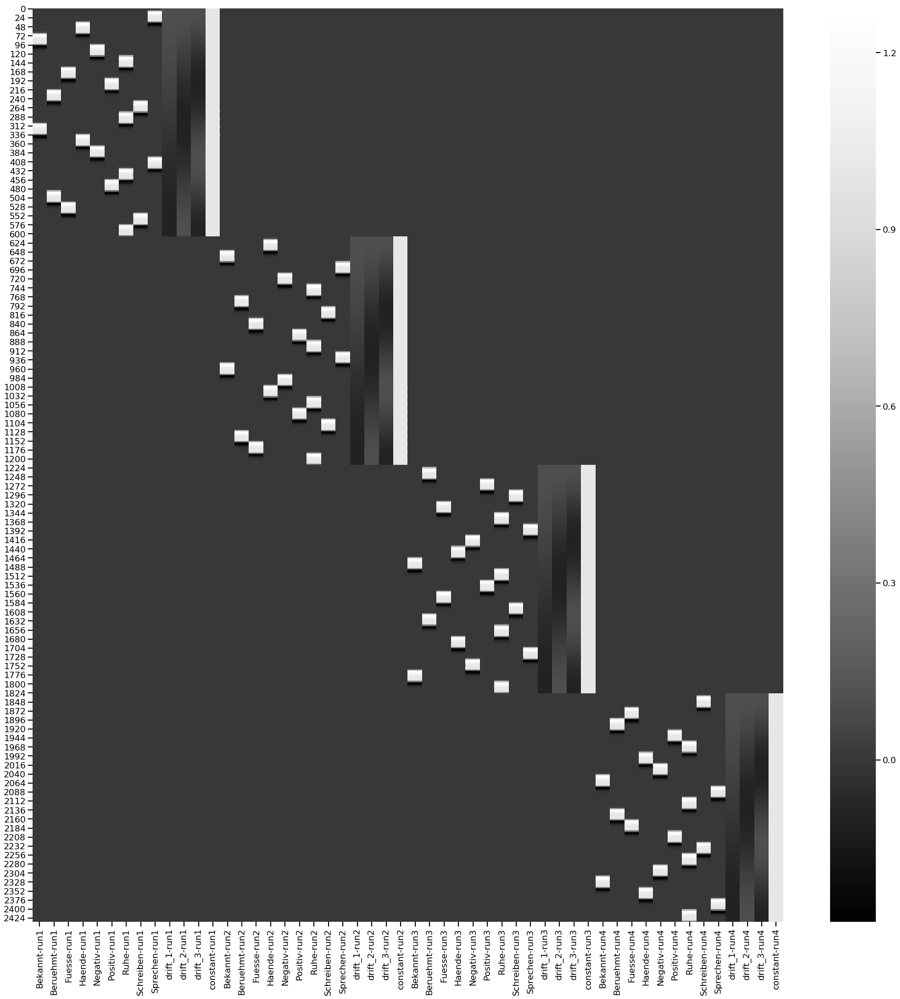

In [18]:
fig,ax = plt.subplots(1,1,figsize=(32,32))
sns.heatmap(design_matrix,ax=ax,cmap='Greys_r')
plt.show()

### Ein Modell welches Daten und Design verbindet

<font color=red>__Modifikation:__ Die Maske welche die zu analysierenden Voxel definiert kann aus ../data/ gewählt und hier angewendet werden</font>

In [19]:
masks = glob.glob('../data/*brainmask*')
masks

['../data/sub-01_task-imagery_run-01_bold_space-MNI152NLin2009cAsym_brainmask.nii.gz',
 '../data/sub-01_task-imagery_run-00_bold_space-MNI152NLin2009cAsym_brainmask.nii.gz',
 '../data/sub-01_task-imagery_run-04_bold_space-MNI152NLin2009cAsym_brainmask.nii.gz',
 '../data/sub-01_task-imagery_run-02_bold_space-MNI152NLin2009cAsym_brainmask.nii.gz',
 '../data/sub-01_task-imagery_run-03_bold_space-MNI152NLin2009cAsym_brainmask.nii.gz']

/opt/miniconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


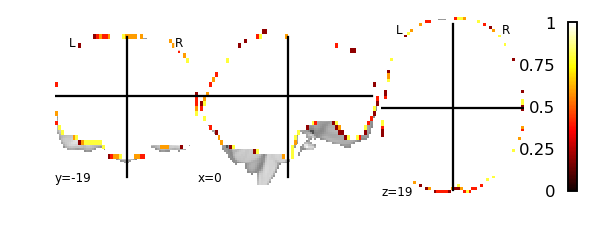

In [20]:
mean_mask = image.mean_img(masks)
plotting.plot_stat_map(mean_mask)

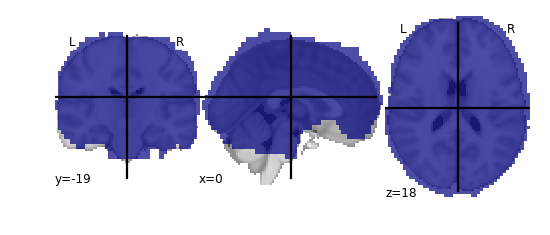

In [21]:
my_mask = image.math_img('img1>0',img1=mean_mask)
plotting.plot_roi(my_mask)

<font color=green>__Modifikation:__ Der Grad an räumlicher Glättung kann variiert werden</font>  

In [23]:
fmri_glm = first_level_model.FirstLevelModel(t_r=3,
                                             smoothing_fwhm=6, # hier auswählen,
                                             mask=my_mask # hier maske anwenden
                                            )

In [24]:
fmri_glm = fmri_glm.fit(fmri_imgs,design_matrices=design_matrix)

/opt/miniconda3/lib/python3.7/site-packages/nilearn/_utils/cache_mixin.py:232: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if (memory.cachedir is None and memory_level is not None


Welche Einstellungen hat das Modell?

In [25]:
fmri_glm

FirstLevelModel(drift_model='cosine', drift_order=1, fir_delays=[0],
        hrf_model='glover',
        mask=<nibabel.nifti1.Nifti1Image object at 0x7fc4246fb518>,
        memory=Memory(location=None), memory_level=1, min_onset=-24,
        minimize_memory=True, n_jobs=1, noise_model='ar1', period_cut=128,
        signal_scaling=True, slice_time_ref=0.0, smoothing_fwhm=6,
        standardize=False, subject_label=None, t_r=3, target_affine=None,
        target_shape=None, verbose=0)

Wie sieht der zu analysierende Bereich aus?

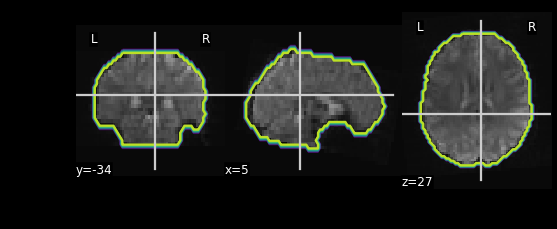

In [26]:
display = plotting.plot_anat(mean_epi_img)
display.add_contours(fmri_glm.masker_.mask_img_)

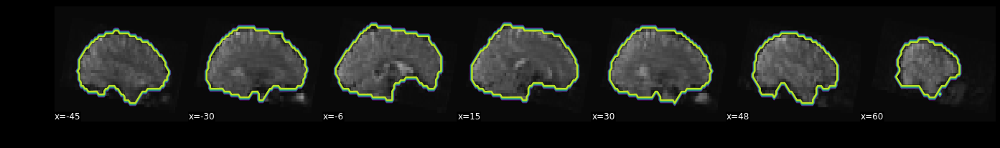

In [27]:
display = plotting.plot_anat(mean_epi_img,display_mode='x')
display.add_contours(fmri_glm.masker_.mask_img_)

### Wie korrelieren die Regressoren der Design-Matrix miteinander?

In [28]:
design_matrix = fmri_glm.design_matrices_[-1]

In [29]:
corr_df = design_matrix.corr()

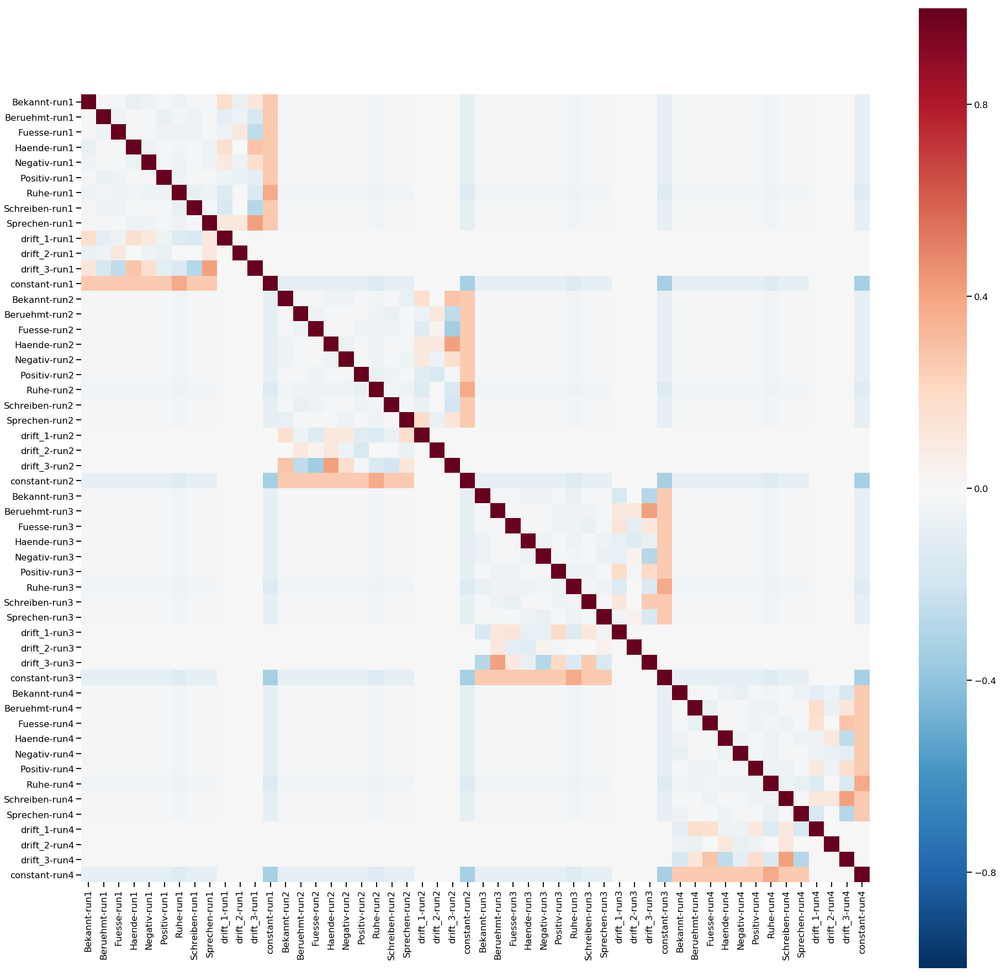

In [30]:
fig,ax = plt.subplots(1,1,figsize=(32,32))
sns.heatmap(corr_df,
            cmap='RdBu_r',
            square=True,
            vmin=-1,
            vmax=1,
            ax=ax)
plt.show()

## Ergebnisse berechnen

Wie viele runs haben wir?

In [31]:
n_runs = len(fmri_img_list)
n_runs

4

###  Die Bedingungen definieren

Anzahl an Regressoren insgesamt

In [32]:
n_cols = design_matrix.shape[1]
n_cols

52

Anzahl Regressoren pro Run

In [33]:
n_conditions = int(n_cols/n_runs)
n_conditions

13

So viele Nullen wie Regressoren

In [34]:
zero_array = np.zeros(n_conditions)
zero_array

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

Liste mit allen Bedingungen

In [35]:
cond_names = np.unique([x.split('-')[0] for x in design_matrix.columns if 'drift' not in x and 'constant' not in x])
cond_names

array(['Bekannt', 'Beruehmt', 'Fuesse', 'Haende', 'Negativ', 'Positiv',
       'Ruhe', 'Schreiben', 'Sprechen'], dtype='<U9')

<font color=green>__Modifikation:__ Die fehlenden Bedingungen hinzufügen</font>

In [36]:
conditions = {}
for i,cond in enumerate(cond_names):
    this_array = zero_array.copy()
    this_array[i] = 1
    conditions[cond] = np.array(list(this_array)*n_runs)

In [37]:
conditions

{'Bekannt': array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.]),
 'Beruehmt': array([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.]),
 'Fuesse': array([0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0.]),
 'Haende': array([0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
   

In [38]:
def show_conds(conditions):
    con_df = pd.DataFrame(conditions,index=design_matrix.columns).T
    plt.figure(figsize=(24,4))
    sns.heatmap(con_df,
                square=True,cbar=False,cmap='Greys_r',annot=True);
    plt.show()

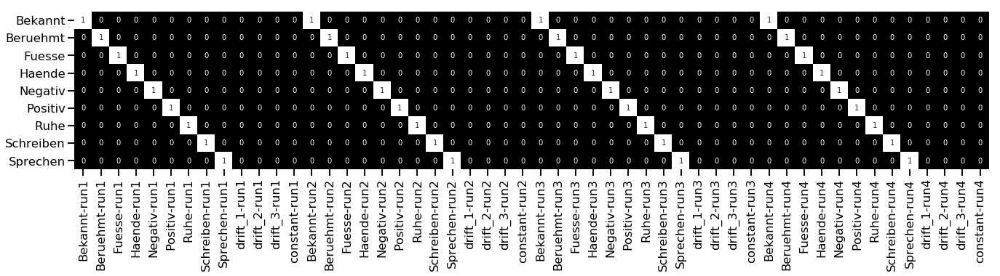

In [39]:
show_conds(conditions)

### Einen Kontrast definieren

In [40]:
contrast = conditions['Bekannt'] - conditions['Beruehmt']

<font color=green>__Modifikation:__ Andere Vergleiche von zwei Bedinungen rechnen</font>  
<font color=orange>__Modifikation:__ Eine Bedingung gegen alle anderen vergleichen</font>  
<font color=red>__Modifikation:__ Eine 1-faktorielle ANOVA mit 5 Stufen formulieren</font>

In [41]:
def show_conts(contrast,design_matrix=design_matrix):
    con_df = pd.DataFrame(contrast,index=design_matrix.columns).T
    plt.figure(figsize=(32,4))
    sns.heatmap(con_df,
                square=True,cbar=False,cmap='Greys_r',annot=True);
    plt.yticks([])
    plt.show()

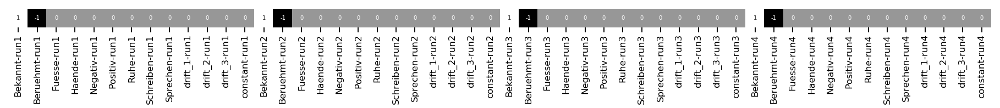

In [42]:
show_conts(contrast)

### Eine Ergebniskarte generieren

<font color=green>__Modifikation:__ z-Werte, t-Werte und p-Werte plotten</font>  

In [45]:
result_map = fmri_glm.compute_contrast(contrast,
                                       output_type='z_score' # art des outputs hier auswählen
                                      )

### Die Karte visualisieren

<font color=green>__Modifikation:__ Einen anderen Schwellenwert auswählen</font>  

In [46]:
display = plotting.view_img(result_map,
                            bg_img=mpr_img,
                            threshold=5 # hier auswählen
                           )

/opt/miniconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [47]:
display

<font color=red>__Modifikation:__ Eine Karte mit t-Werten plotten, die bei p<0.001 gethresholded ist</font>  

In [48]:
z_map = fmri_glm.compute_contrast(contrast,output_type='z_score')
p_map = fmri_glm.compute_contrast(contrast,output_type='p_value')

/opt/miniconda3/lib/python3.7/site-packages/nilearn/_utils/cache_mixin.py:232: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if (memory.cachedir is None and memory_level is not None


In [85]:
z_thresholded_map = image.math_img('img1*(img2<0.001)',
                               img1=z_map,
                               img2=p_map)

In [86]:
z_thresholded_data = z_thresholded_map.get_data().ravel()

In [87]:
z_thresholded_data[abs(z_thresholded_data)>0].min()

3.0903984456100915

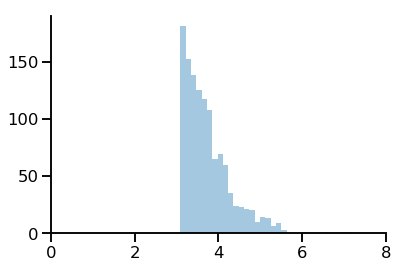

In [88]:
sns.distplot(z_thresholded_data[z_thresholded_data>0],kde=False)
plt.xlim(0,8)
sns.despine()
plt.show()

In [89]:
display = plotting.view_img(z_thresholded_map,
                            bg_img=mpr_img,
                            #threshold=5 -> brauchen wir nicht mehr
                           )
display

/opt/miniconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


<font color=green>__Modifikation:__ display in neuem Fenster im Vollbildmodus öffnen</font>  

In [ ]:
display.open_in_browser()

<font color=red>__Modifikation:__ Eine Tabelle mit Aktivierungen als Koordinaten ausgeben lassen</font>

In [90]:
result_table = reporting.get_clusters_table(result_map,stat_threshold=3)
result_table

,Cluster ID,X,Y,Z,Peak Stat,Cluster Size (mm3)
0,1,57.0,6.0,-33.0,7.148142,135
1,2,-15.0,-57.0,87.0,6.996230,405
2,3,-15.0,42.0,12.0,6.568319,7425
3,3a,-3.0,54.0,7.0,5.435032,
4,3b,3.0,60.0,22.0,5.427958,
5,3c,-3.0,48.0,-3.0,5.094295,
6,4,6.0,-57.0,27.0,6.044100,5040
7,4a,15.0,-45.0,32.0,4.438788,
8,4b,6.0,-51.0,37.0,4.128669,
9,4c,6.0,-66.0,37.0,3.827829,


<font color=red>__Modifikation:__ Eine 1-faktorielle ANOVA rechnen</font>

In [91]:
con_df = pd.DataFrame(conditions,index=design_matrix.columns).T
con_df

,Bekannt-run1,Beruehmt-run1,Fuesse-run1,Haende-run1,Negativ-run1,Positiv-run1,Ruhe-run1,Schreiben-run1,Sprechen-run1,drift_1-run1,...,Haende-run4,Negativ-run4,Positiv-run4,Ruhe-run4,Schreiben-run4,Sprechen-run4,drift_1-run4,drift_2-run4,drift_3-run4,constant-run4
Bekannt,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Beruehmt,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Fuesse,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Haende,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Negativ,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Positiv,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Ruhe,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
Schreiben,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
Sprechen,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


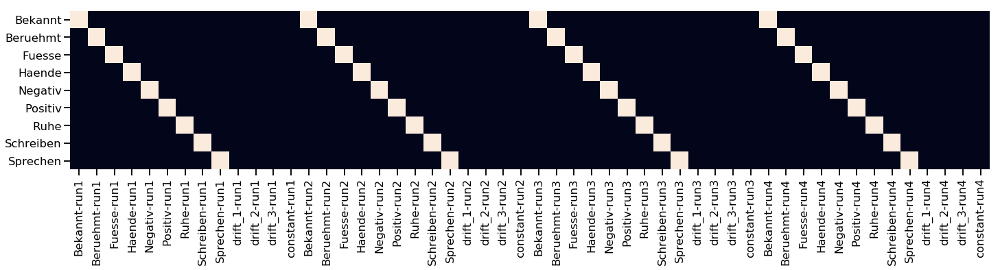

In [92]:
fig,ax = plt.subplots(1,1,figsize=(24,6))
sns.heatmap(con_df,square=True,cbar=False,axes=ax)
plt.show()

In [93]:
f_contrast = con_df.values
f_contrast

array([[1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
        0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
        0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0., 0., 

In [94]:
f_map = fmri_glm.compute_contrast(f_contrast,stat_type='F')

/opt/miniconda3/lib/python3.7/site-packages/nilearn/_utils/cache_mixin.py:232: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if (memory.cachedir is None and memory_level is not None


In [95]:
display = plotting.view_img(f_map,bg_img=mpr_img,threshold=3)

/opt/miniconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:272: DeprecationWarning: In future, it will be an error for 'np.bool_' scalars to be interpreted as an index
  return _nd_image.find_objects(input, max_label)


In [96]:
display

### Atlas Tools

Einen Atlas laden

In [97]:
from nilearn import datasets

In [98]:
atlas = datasets.fetch_atlas_harvard_oxford('cort-maxprob-thr25-2mm')

<font color=orange>__Modifikation:__ Atlas mit anderen Einstellungen laden</font>  
<font color=red>__Modifikation:__ Einen anderen Atlas verwenden</font>

Den Atlas anzeigen

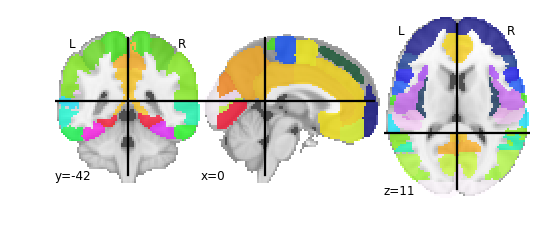

In [99]:
plotting.plot_roi(atlas['maps'])

Die Regionen die im Atlas enthalten sind auflisten

In [100]:
pd.DataFrame(atlas['labels'])

,0
0,Background
1,Frontal Pole
2,Insular Cortex
3,Superior Frontal Gyrus
4,Middle Frontal Gyrus
5,"Inferior Frontal Gyrus, pars triangularis"
6,"Inferior Frontal Gyrus, pars opercularis"
7,Precentral Gyrus
8,Temporal Pole
9,"Superior Temporal Gyrus, anterior division"


Den Atlas zum Extrahieren der Daten verwenden

In [101]:
atlas_masker = input_data.NiftiLabelsMasker(atlas['maps'],background_label=None).fit()

In [102]:
atlas_data = atlas_masker.transform([z_map])

/opt/miniconda3/lib/python3.7/site-packages/nilearn/_utils/cache_mixin.py:232: DeprecationWarning: The 'cachedir' attribute has been deprecated in version 0.12 and will be removed in version 0.14.
Use os.path.join(memory.location, 'joblib') attribute instead.
  if (memory.cachedir is None and memory_level is not None


<font color=green>__Modifikation:__ Andere Statistikkarte als Input verwenden</font>  

Die extrahierten Werte:

In [103]:
atlas_data

array([[-0.00860045,  0.10045395, -0.29649273,  0.63932226,  0.41125255,
         0.48540182, -0.37235471,  0.21622684, -0.02562235,  0.25408379,
         0.11404364,  1.39911363,  0.80727261,  0.40598852,  0.32534981,
        -0.08035623,  0.75107754,  0.18149176,  0.48388776,  0.53648453,
         0.45909061,  0.7666001 ,  0.56274209,  0.81342869, -1.19865263,
         0.20382548,  0.31147168,  0.12203179,  1.08594923,  1.06401165,
         0.79810798,  1.20910436, -0.30354002, -0.32115041, -0.13385647,
         0.21270698, -0.33240263,  0.05570209, -0.24669982,  0.0204065 ,
        -0.02759416, -0.16735572,  0.11936509, -0.03009102,  0.23632952,
         0.19943971,  0.00834049, -0.66140045, -0.24552417]])

In [104]:
atlas_data.shape

(1, 49)

Die extrahierten Werte in eine Tabelle packen

In [106]:
df = pd.DataFrame(atlas_data,columns=atlas['labels']).T
df.columns = ['z-score']

In [107]:
df

,z-score
Background,-0.008600
Frontal Pole,0.100454
Insular Cortex,-0.296493
Superior Frontal Gyrus,0.639322
Middle Frontal Gyrus,0.411253
"Inferior Frontal Gyrus, pars triangularis",0.485402
"Inferior Frontal Gyrus, pars opercularis",-0.372355
Precentral Gyrus,0.216227
Temporal Pole,-0.025622
"Superior Temporal Gyrus, anterior division",0.254084


<font color=red>__Modifikation:__ Eine Abbildung erstellen in der die Regionen nach Aktivierungstärke sortiert sind</font>